# Damages - Deep Learning Coursework 2024

The aim of this coursework will be for you to design, implement and test a deep learning architecture to detect and identify damage in images. Digitization allows to make historical pictures and art much more widely available to the public. Many such pictures have suffered some form of damage due to time, storage conditions and the fragility of the original medium. For example, the image below (A) shows an example of a digitized parchment that has suffered significant damage over time.

**The aim of this project is for you to design, implement and evaluate a deep learning model to detect and identify damage present in images.**

<table>
<tr>
<td>
<div>
<img src="damage_data/image_path/cljmrkz5n341f07clcujw105j.png" width="500"/>
</div>
</td>
<td>
<div>
<img src="damage_data/annotation_rgb_path/cljmrkz5n341f07clcujw105j.png" width="500"/>
</div>
</td>
</tr>
<td><center>(A) Image</center></td><td><center>(B) damage labels</center></td>
</table>
*(Note that the images will only show once you have downloaded the dataset)*


The image labels in this figure (B) identifies a smatter of peeling paint, a large stained area in the bottom left and a missing part on the top left. Each colour in those images corresponds to a different category of damage, including `fold`, `writing` or `burn marks`. You are provided with a dataset of a variety of damaged images, from Parchment to ceramic or wood painting, and detailed annotations of a range of damages.

You are free to use any architecture you prefer, from what we have seen in class. You can decide to use unsupervised pre-training of only supervised end-to-end training - the approach you choose is your choice.

### Hand-in date: Friday 15th of March before 4:30pm (on Moodle)

### Steps & Hints
* First, look at the data. What are the different type of images (content), what type of material, what type of damage? How different are they? What type of transformations for your data augmentation do you think would be acceptable here?.
* Second, check the provided helper functions for loading the data and separate into training and test set and cross-validation.
* Design a network for the task. What output? What layers? How many? Do you want to use an Autoencoder for unsupervised pre-training?
* Choose a loss function for your network
* Select optimiser and training parameters (batch size, learning rate)
* Optimise your model, and tune hyperparameters (especially learning rate, momentum etc)
* Analyse the results on the test data. How to measure success? Which classes are recognised well, which are not? Is there confusion between some classes? Look at failure cases.
* If time allows, go back to drawing board and try a more complex, or better, model.
* Explain your thought process, justify your choices and discuss the results!

### Submission
* submit ONE zip file on Moodle containing:
  * **your notebook**: use `File -> download .ipynb` to download the notebook file locally from colab.
  * **a PDF file** of your notebook's output as you see it: use `File -> print` to generate a PDF.
* your notebook must clearly contains separate cells for:
  * setting up your model and data loader
  * training your model from data
  * loading your pretrained model from github/gitlab/any other online storage you like!
  * testing your model on test data.
* The training cells must be disabled by a flag, such that when running *run all* on your notebook it does
  * load the data
  * load your model
  * apply the model to the test data
  * analyse and display the results and accuracy
* In addition provide markup cell:
  * containing your student number at the top
  * to describe and motivate your design choices: architecture, pre-processing, training regime
  * to analyse, describe and comment on your results
  * to provide some discussion on what you think are the limitations of your solution and what could be future work

* **Note that you must put your trained model online so that your code can download it.**


### Assessment criteria
* In order to get a pass mark, you will need to demonstrate that you have designed and trained a deep NN to solve the problem, using sensible approach and reasonable efforts to tune hyper-parameters. You have analysed the results. It is NOT necessary to have any level of accuracy (a network that predicts poorly will always yield a pass mark if it is designed, tuned and analysed sensibly).
* In order to get a good mark, you will show good understanding of the approach and provide a working solution.
* in order to get a high mark, you will demonstrate a working approach of gradual improvement between different versions of your solution.
* bonus marks for attempting something original if well motivated - even if it does not yield increased performance.
* bonus marks for getting high performance, and some more points are to grab for getting the best performance in the class.

### Notes
* You are provided code to isolate the test set and cross validation, make sure to keep the separation clean to ensure proper setting of all hyperparameters.
* I recommend to start with small models that can be easier to train to set a baseline performance before attempting more complex one.
* Be mindful of the time!

## Housekeeping

In [52]:
from google.colab import drive
drive.mount('/content/drive')

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


In [53]:
!pip install gdown pytorch_lightning

In [98]:


import torch
import torch.nn as nn
import torch.optim as optim
import torch.nn.functional as F
from torch.utils.data import Dataset, DataLoader

import pytorch_lightning as pl
from pytorch_lightning.loggers import WandbLogger
from pytorch_lightning.callbacks import LearningRateMonitor, ModelCheckpoint

import os
import pandas as pd
import PIL
PIL.Image.MAX_IMAGE_PIXELS = 243748701
from PIL import Image
import numpy as np
import matplotlib.pyplot as plt
import gdown
import shutil

device = torch.device("cuda:0") if torch.cuda.is_available() else torch.device("cpu")
print(device)

# NOTEBOOK FLAGS AND VARIABLES

BATCH_SIZE = 4
to_train = False

cpu


# Load dataset

We then load the metadata in a dataframe for convenience

In [55]:
# !pwd

In [56]:
# !gdown 1v8aUId0-tTW3ln3O2BE4XajQeCToOEiS -O damages.zip

In [57]:
# set  that to wherever you want to store the data (eg, your Google Drive), choose a persistent location!
root_dir = "/content/drive/MyDrive/Colab Notebooks/Deep Learning CW/"
data_dir = os.path.join(root_dir, "damage_data")
csv_path = os.path.join(data_dir, 'metadata.csv')

try:
    df = pd.read_csv(csv_path)

except:  # if the dataset has not been downloaded yet, do it.
    zip_path = os.path.join(root_dir, 'damages.zip')
    gdown.download(id='1v8aUId0-tTW3ln3O2BE4XajQeCToOEiS', output=zip_path)
    shutil.unpack_archive(zip_path, root_dir)
    df = pd.read_csv(csv_path)

This dataframe has the paths of where the dataset images and annotation labels are stored, plus classification labels.

In [58]:
df

,id,material,content,image_path,annotation_path,annotation_rgb_path
0,cljmrkz5n341f07clcujw105j,Parchment,Artistic depiction,./damage_data/image_path/cljmrkz5n341f07clcujw...,./damage_data/annotation_path/cljmrkz5n341f07c...,./damage_data/annotation_rgb_path/cljmrkz5n341...
1,cljmrkz5n341n07clf1u410ed,Parchment,Artistic depiction,./damage_data/image_path/cljmrkz5n341n07clf1u4...,./damage_data/annotation_path/cljmrkz5n341n07c...,./damage_data/annotation_rgb_path/cljmrkz5n341...
2,cljmrkz5n341r07clhl93dpre,Parchment,Artistic depiction,./damage_data/image_path/cljmrkz5n341r07clhl93...,./damage_data/annotation_path/cljmrkz5n341r07c...,./damage_data/annotation_rgb_path/cljmrkz5n341...
3,cljmrkz5n341v07cl2gfhd6zj,Parchment,Artistic depiction,./damage_data/image_path/cljmrkz5n341v07cl2gfh...,./damage_data/annotation_path/cljmrkz5n341v07c...,./damage_data/annotation_rgb_path/cljmrkz5n341...
4,cljmrkz5n341z07cldbn01un3,Parchment,Artistic depiction,./damage_data/image_path/cljmrkz5n341z07cldbn0...,./damage_data/annotation_path/cljmrkz5n341z07c...,./damage_data/annotation_rgb_path/cljmrkz5n341...
...,...,...,...,...,...,...
390,clnofow7i00n2076ubpfodf4d,Wood,Artistic depiction,./damage_data/image_path/clnofow7i00n2076ubpfo...,./damage_data/annotation_path/clnofow7i00n2076...,./damage_data/annotation_rgb_path/clnofow7i00n...
391,clnrm7fvu092q07840tq9zs03,Wood,Artistic depiction,./damage_data/image_path/clnrm7fvu092q07840tq9...,./damage_data/annotation_path/clnrm7fvu092q078...,./damage_data/annotation_rgb_path/clnrm7fvu092...
392,clnrm7fvu092r0784a6p2m5li,Wood,Artistic depiction,./damage_data/image_path/clnrm7fvu092r0784a6p2...,./damage_data/annotation_path/clnrm7fvu092r078...,./damage_data/annotation_rgb_path/clnrm7fvu092...
393,clnrm7fvu092s0784tgwccewe,Wood,Artistic depiction,./damage_data/image_path/clnrm7fvu092s0784tgwc...,./damage_data/annotation_path/clnrm7fvu092s078...,./damage_data/annotation_rgb_path/clnrm7fvu092...


The images in the dataset are categorised in terms of the type of `material`, meaning what was the original picture on, eg, Parchment, Glass or Textile.

In [59]:
df['material'].unique()

array(['Parchment', 'Film emulsion', 'Glass', 'Paper', 'Tesserae',
       'Canvas', 'Textile', 'Ceramic', 'Wood'], dtype=object)

Moreover, images are also categorised in terms on the `content` of the image, meaning what is depicted: eg, Line art, geometric patterns, etc.

In [60]:
df['content'].unique()

array(['Artistic depiction', 'Line art', 'Photographic depiction',
       'Geometric patterns'], dtype=object)

## Labels
Segmentation labels are saved as a PNG image, where each number from 1 to 15 corresponds to a damage class like Peel, Scratch etc; the Background class is set to 255, and the Clean class (no damage) is set to 0. We also provide code to convert these annotation values to RGB colours for nicer visualisation, but for training you should use the original annotations.

In [61]:
name_color_mapping = {
    "Material loss": "#1CE6FF",
    "Peel": "#FF34FF",
    "Dust": "#FF4A46",
    "Scratch": "#008941",
    "Hair": "#006FA6",
    "Dirt": "#A30059",
    "Fold": "#FFA500",
    "Writing": "#7A4900",
    "Cracks": "#0000A6",
    "Staining": "#63FFAC",
    "Stamp": "#004D43",
    "Sticker": "#8FB0FF",
    "Puncture": "#997D87",
    "Background": "#5A0007",
    "Burn marks": "#809693",
    "Lightleak": "#f6ff1b",
}

class_names = [ 'Material loss', 'Peel', 'Dust', 'Scratch',
                'Hair', 'Dirt', 'Fold', 'Writing', 'Cracks', 'Staining', 'Stamp',
                'Sticker', 'Puncture', 'Burn marks', 'Lightleak', 'Background']

class_to_id = {class_name: idx+1 for idx, class_name in enumerate(class_names)}
class_to_id['Background'] = 255  # Set the Background ID to 255

def hex_to_rgb(hex_color: str) -> tuple:
    hex_color = hex_color.lstrip('#')
    return tuple(int(hex_color[i:i+2], 16) for i in (0, 2, 4))

id_to_rgb = {class_to_id[class_name]: hex_to_rgb(color) for class_name, color in name_color_mapping.items()}
id_to_rgb[0] = (0,0,0)

# Create id2label mapping: ID to class name
id2label = {idx: class_name for class_name, idx in class_to_id.items()}

# Create label2id mapping: class name to ID, which is the same as class_to_id
label2id = class_to_id

# Non-damaged pixels
id2label[0] = 'Clean'
label2id['Clean'] = 0

In [62]:
from IPython.display import Markdown

legend='#### Colour labels for each damage type\n'
for damage in class_names:
    legend += '- <span style="color: {color}">{damage}</span>.\n'.format(color=name_color_mapping[damage], damage=damage)
display(Markdown(legend))

#### Colour labels for each damage type
- <span style="color: #1CE6FF">Material loss</span>.
- <span style="color: #FF34FF">Peel</span>.
- <span style="color: #FF4A46">Dust</span>.
- <span style="color: #008941">Scratch</span>.
- <span style="color: #006FA6">Hair</span>.
- <span style="color: #A30059">Dirt</span>.
- <span style="color: #FFA500">Fold</span>.
- <span style="color: #7A4900">Writing</span>.
- <span style="color: #0000A6">Cracks</span>.
- <span style="color: #63FFAC">Staining</span>.
- <span style="color: #004D43">Stamp</span>.
- <span style="color: #8FB0FF">Sticker</span>.
- <span style="color: #997D87">Puncture</span>.
- <span style="color: #809693">Burn marks</span>.
- <span style="color: #f6ff1b">Lightleak</span>.
- <span style="color: #5A0007">Background</span>.


## Create dataset splits

Here is an example of how to split the dataset for Leave-one-out cross validation (LOOCV) based on material.

In [63]:
def create_leave_one_out_splits(df, criterion='material'):
    grouped = df.groupby(criterion)
    content_splits = {name: group for name, group in grouped}
    unique_val = df[criterion].unique()

    # Initialize a dictionary to hold the train and validation sets for each LOOCV iteration
    loocv_splits = {}

    for value in unique_val:
        # Create the validation set
        val_set = content_splits[value]

        # Create the training set
        train_set = pd.concat([content_splits[c] for c in unique_val if c != value])

        # Add these to the loocv_splits dictionary
        loocv_splits[value] = {'train_set': train_set, 'val_set': val_set}

    return loocv_splits

For this coursework, we will want to assess the generalisation of the method, so for that we will keep one type of material (`Canvas`) as test set, and only train on the remaining ones.

In [99]:
# split the dataset according to material type
full_splits = create_leave_one_out_splits(df, 'material')

# use Canvas as test set
test_set = full_splits['Canvas']['val_set']

# use the rest as training set
train_set = full_splits['Canvas']['train_set']

# prepare a leave-one-out cross validation for the training set
loocv_splits = create_leave_one_out_splits(train_set, 'material')

# identify the different type of image content
unique_material = train_set['material'].unique()
print(unique_material)


['Parchment' 'Film emulsion' 'Glass' 'Paper' 'Tesserae' 'Textile'
 'Ceramic' 'Wood']


To help you, here are some helper functions to help crop and process images.

In [100]:
def random_square_crop_params(image, target_size):
    width, height = image.size
    min_edge = min(width, height)

    # Conditionally set the range for random crop size
    lower_bound = min(min_edge, target_size)
    upper_bound = max(min_edge, target_size)

    # Generate crop_size
    crop_size = random.randint(lower_bound, upper_bound)

    # Check and adjust if crop_size is larger than any dimension of the image
    if crop_size > width or crop_size > height:
        crop_size = min(width, height)

    # Generate random coordinates for the top-left corner of the crop
    x = random.randint(0, width - crop_size)
    y = random.randint(0, height - crop_size)

    return (x, y, x + crop_size, y + crop_size)

def apply_crop_and_resize(image, coords, target_size):
    image_crop = image.crop(coords)
    image_crop = image_crop.resize((target_size, target_size), Image.NEAREST)
    return image_crop

We also provide a simple class for holding the dataset

In [101]:
import torch
from torch.utils.data import DataLoader, Dataset
from torchvision import transforms
import random
import numpy as np
from PIL import Image

from torchvision import transforms

class CustomDataset(Dataset):
    def __init__(self, dataframe, target_size, is_train=True):
        self.dataframe = dataframe
        self.target_size = target_size
        self.is_train = is_train

        self.to_tensor = transforms.ToTensor()

        # Define the normalization transform
        self.normalize = transforms.Normalize(mean=[0.485, 0.456, 0.406],
                                              std=[0.229, 0.224, 0.225])

    def __len__(self):
            return len(self.dataframe)

    def __getitem__(self, idx):
        row = self.dataframe.iloc[idx]
        image = Image.open(root_dir + row['image_path']).convert('RGB')
        annotation = Image.open(root_dir + row['annotation_path']).convert('L')
        annotation_rgb = Image.open(root_dir + row['annotation_rgb_path']).convert('RGB')
        id = row['id']
        material = row['material']
        content = row['content']

        if self.is_train:
            # Generate random square cropping coordinates
            crop_coords = random_square_crop_params(image, self.target_size)

            # Apply the same cropping and resizing to all
            image = apply_crop_and_resize(image, crop_coords, self.target_size)
            annotation = apply_crop_and_resize(annotation, crop_coords, self.target_size)
            annotation_rgb = apply_crop_and_resize(annotation_rgb, crop_coords, self.target_size)
        else:  # Validation
            # Instead of cropping, downsize the images so that the longest edge is 1024 or less
            max_edge = max(image.size)
            if max_edge > 1024:
                downsample_ratio = 1024 / max_edge
                new_size = tuple([int(dim * downsample_ratio) for dim in image.size])

                image = image.resize(new_size, Image.BILINEAR)
                annotation = annotation.resize(new_size, Image.NEAREST)
                annotation_rgb = annotation_rgb.resize(new_size, Image.BILINEAR)

        # Convert PIL images to PyTorch tensors
        image = self.to_tensor(image)
        annotation = torch.tensor(np.array(annotation), dtype=torch.long)
        annotation_rgb = self.to_tensor(annotation_rgb)

        # Normalize the image
        image = self.normalize(image)

        # Change all values in annotation that are 255 to 16
        annotation[annotation == 255] = 16

        return {
            'image': image,
            'annotation': annotation,
            'annotation_rgb': annotation_rgb,
            'id': id,
            'material': material,
            'content': content
        }

Here we create a DataModule which encapsulates our training and validation DataLoaders; you can also do this manually by only using the Pytorch DataLoader class, lines 24 and 27.

In [102]:
from torch.utils.data import DataLoader

class CustomDataModule(pl.LightningDataModule):
    def __init__(self, loocv_splits, current_material, target_size, batch_size=32, num_workers=4):
        super().__init__()
        self.loocv_splits = loocv_splits
        self.current_material = current_material
        self.target_size = target_size
        self.batch_size = batch_size
        self.num_workers = num_workers

    def prepare_data(self):
        pass

    def setup(self, stage=None):
        # Load current train and validation set based on LOOCV iteration
        train_df = self.loocv_splits[self.current_material]['train_set']
        val_df = self.loocv_splits[self.current_material]['val_set'].sample(frac=1).reset_index(drop=True)

        self.train_dataset = CustomDataset(dataframe=train_df, target_size=self.target_size, is_train=True)
        self.val_dataset = CustomDataset(dataframe=val_df, target_size=self.target_size, is_train=False)

    def train_dataloader(self):
        return DataLoader(self.train_dataset, batch_size=self.batch_size, shuffle=True, num_workers=self.num_workers)

    def val_dataloader(self):
        return DataLoader(self.val_dataset, batch_size=1, shuffle=False, num_workers=self.num_workers)

    def test_dataloader(self):
        pass


The following will create a data module for validating on the first content in the list (`Parchment`) and training on all the other types of material (you will want to do that for each fold).

In [103]:
data_module = CustomDataModule(loocv_splits=loocv_splits,
                               current_material=unique_material[0],
                               target_size=512,
                               batch_size=BATCH_SIZE,
                               num_workers=0)

Finally, we can get the train and validation data loaders from the data module.

In [104]:
data_module.setup()
train_loader = data_module.train_dataloader()
val_loader = data_module.val_dataloader()

# Dataset visualisation

We need to denormalise the images so we can display them

In [105]:
# Mean and std used for normalization
mean = [0.485, 0.456, 0.406]
std = [0.229, 0.224, 0.225]

def denormalize(image, mean = [0.485, 0.456, 0.406], std = [0.229, 0.224, 0.225]):
    img_cpy = image.copy()
    for i in range(3):
        img_cpy[..., i] = img_cpy[..., i] * std[i] + mean[i]
    return img_cpy

## Visualise training samples
Random square crops of the images and correspoding RGB annotations on their own and overlaid onto the image.

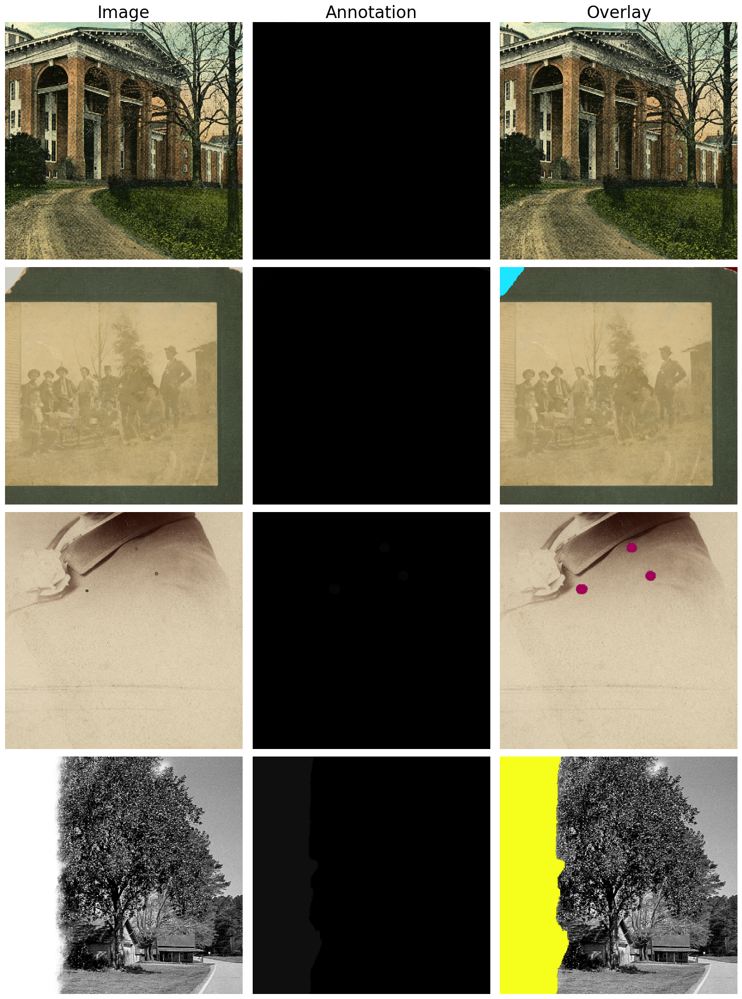

In [106]:
# Get an example batch from the train loader
example_batch = next(iter(train_loader))
example_images = example_batch['image']  # Input images
example_annotations = example_batch['annotation']  # Annotation masks
example_annotation_rgbs = example_batch['annotation_rgb']  # RGB representation of annotation masks

# Number of examples to visualize
num_examples = min(4, len(example_images))

# Create subplots
fig, axes = plt.subplots(num_examples, 3, figsize=(15, 5 * num_examples))

# Set titles for each column
for ax, col in zip(axes[0], ['Image', 'Annotation', 'Overlay']):
    ax.set_title(col, fontsize=24)

# Visualize each example
for i in range(num_examples):
    # Extract current example data
    current_image = denormalize(example_images[i].numpy().transpose((1, 2, 0)), mean, std)  # Convert image tensor to numpy array
    current_annotation = Image.fromarray(np.uint8(example_annotations[i].numpy()), 'L')  # Convert annotation mask tensor to PIL Image
    current_annotation_rgb = example_annotation_rgbs[i].numpy().transpose((1, 2, 0))  # Convert RGB annotation mask tensor to numpy array

    # Create an alpha (transparency) channel where black pixels in annotation_rgb are fully transparent
    alpha_channel = np.all(current_annotation_rgb == [0, 0, 0], axis=-1)
    current_annotation_rgba = np.dstack((current_annotation_rgb, np.where(alpha_channel, 0, 1)))

    # Plot the current example
    axes[i, 0].imshow(current_image)
    axes[i, 0].axis('off')

    axes[i, 1].imshow(current_annotation, cmap='gray', vmin=0, vmax=255)
    axes[i, 1].axis('off')

    axes[i, 2].imshow(current_image)
    axes[i, 2].imshow(current_annotation_rgba)
    axes[i, 2].axis('off')

# Adjust layout and display the plot
plt.tight_layout()
plt.show()


Visualising the validation set, which loads the left-out class as whole images.

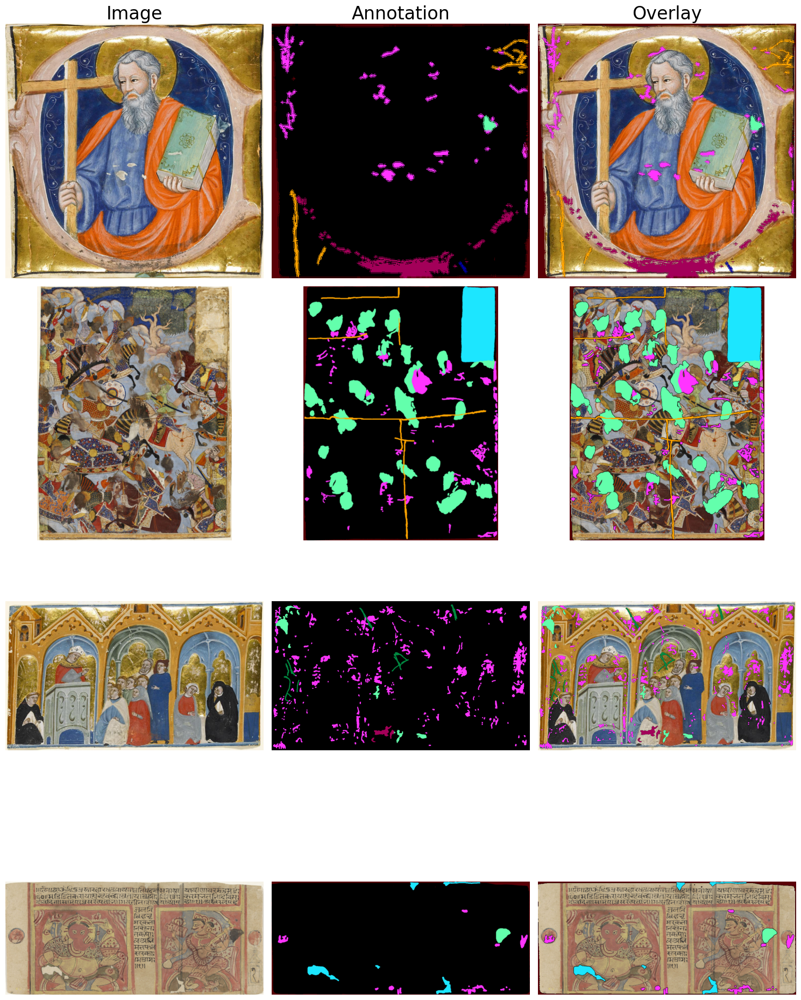

In [107]:
# Get an iterator for the validation loader
val_iter = iter(val_loader)

# Extract example batches from the validation loader
example_batches = [next(val_iter) for _ in range(4)]

# Initialize lists to collect different parts of each batch
example_images = []
example_annotations = []
example_annotation_rgbs = []
example_materials = []
example_contents = []

# Populate lists with data from the example batches
for batch in example_batches:
    example_images.append(batch['image'].squeeze())  # Input images
    example_annotations.append(batch['annotation'].squeeze())  # Annotation masks
    example_annotation_rgbs.append(batch['annotation_rgb'].squeeze())  # RGB representation of annotation masks
    example_materials.append(batch['material'][0])  # Material information
    example_contents.append(batch['content'][0])  # Content information

# Number of examples to visualize
num_examples = min(4, len(example_images))

# Create subplots
fig, axes = plt.subplots(num_examples, 3, figsize=(15, 5 * num_examples))

# Set titles for each column
for ax, col in zip(axes[0], ['Image', 'Annotation', 'Overlay']):
    ax.set_title(col, fontsize=24)

# Visualize each example
for i in range(num_examples):
    # Extract current example data
    current_image = denormalize(example_images[i].numpy().transpose((1, 2, 0)), mean, std)  # Convert image tensor to numpy array
    current_annotation = example_annotations[i].numpy()  # Convert annotation mask tensor to numpy array
    current_annotation_rgb = example_annotation_rgbs[i].numpy().transpose((1, 2, 0))  # Convert RGB annotation mask tensor to numpy array
    current_material = example_materials[i]  # Extract material information
    current_content = example_contents[i]  # Extract content information

    # Create an alpha (transparency) channel where black pixels in annotation_rgb are fully transparent
    alpha_channel = np.all(current_annotation_rgb == [0, 0, 0], axis=-1)
    current_annotation_rgba = np.dstack((current_annotation_rgb, np.where(alpha_channel, 0, 1)))

    # Plot the current example
    axes[i, 0].imshow(current_image)
    axes[i, 0].axis('off')

    axes[i, 1].imshow(current_annotation_rgb)
    axes[i, 1].axis('off')

    axes[i, 2].imshow(current_image)
    axes[i, 2].imshow(current_annotation_rgba)
    axes[i, 2].axis('off')

# Adjust layout and display the plot
plt.tight_layout()
plt.show()


# Evaluation

For the final evaluation of the model, make sure to test performance on the left out category, `Canvas` to have a fair idea on how well the model generalises.

In [108]:
test_module = CustomDataModule(loocv_splits=full_splits,
                               current_material='Canvas',
                               target_size=512,
                               batch_size=4)

test_module.setup()

test_loader = test_module.val_dataloader()


/usr/local/lib/python3.10/dist-packages/torch/utils/data/dataloader.py:558: UserWarning: This DataLoader will create 4 worker processes in total. Our suggested max number of worker in current system is 2, which is smaller than what this DataLoader is going to create. Please be aware that excessive worker creation might get DataLoader running slow or even freeze, lower the worker number to avoid potential slowness/freeze if necessary.
  warnings.warn(_create_warning_msg(


# Solution - 2558994p




## Model - UNet

I used UNet as it is a convolutional neural network (CNN) model for semantic segmentation tasks, like our picture segmentation. The U-Net design was selected for the following reasons, and each part is important:



*    U-Net is a good choice for jobs like recognising damages in photographs because of its precision in segmenting objects in images. A symmetric expanding path (decoder) allows for exact localization, while a contracting path (encoder) captures context.



* These blocks have two convolutional layers, batch normalisation, and ReLU activation in order of precedence. They are employed all across the network to preserve spatial information while extracting characteristics from the input picture. The extraction of hierarchical features at various sizes is made possible by the use of DoubleConv blocks, which facilitates the comprehension of context both locally and globally.
*   The Down and Upsampling Modules assist capture high-level characteristics and minimise spatial dimensions. The Down module uses max-pooling to conduct downsampling, which is followed by DoubleConv blocks. The Up module upsamples data by using transpose convolution or bilinear interpolation, then DoubleConv blocks to enhance segmentation results and restore spatial information lost during downsampling.


*   Output Convolution Layer (OutConv): To create the final segmentation mask, this module uses a single convolutional layer. Using the feature maps from the final decoder layer, it produces pixel-by-pixel predictions for every class.

* The UNet class is initialised with the parameters for initialization and configuration, including the number of input channels (n_channels), the number of output classes (n_classes), and whether or not to employ bilinear interpolation for upsampling (bilinear). This gives the model flexibility in adjusting to various segmentation tasks and properties of the input data.

* To save memory use during training, the use_checkpointing method makes checkpointing possible. This is especially important when training big models, like as U-Net, because the network as a whole may employ memory-intensive techniques like backpropagation, which might lead to memory limitations.









In [109]:
class DoubleConv(nn.Module):
    """Two convolutional layers followed by BatchNorm and ReLU activation."""
    def __init__(self, in_channels, out_channels, mid_channels=None):
        super().__init__()
        if not mid_channels:
            mid_channels = out_channels
        self.double_conv = nn.Sequential(
            nn.Conv2d(in_channels, mid_channels, kernel_size=3, padding=1, bias=False),
            nn.BatchNorm2d(mid_channels),
            nn.ReLU(inplace=True)
        )

    def forward(self, x):
        return self.double_conv(x)

class Down(nn.Module):
    """Downscaling with max-pooling followed by double conv."""
    def __init__(self, in_channels, out_channels):
        super().__init__()
        self.maxpool_conv = nn.Sequential(
            nn.MaxPool2d(2),
            DoubleConv(in_channels, out_channels)
        )

    def forward(self, x):
        return self.maxpool_conv(x)

class Up(nn.Module):
    """Upsampling then double convolution."""
    def __init__(self, in_channels, out_channels, bilinear=True):
        super().__init__()
        if bilinear:
            self.up = nn.Upsample(scale_factor=2, mode='bilinear', align_corners=True)
            self.conv = DoubleConv(in_channels, out_channels, in_channels // 2)
        else:
            self.up = nn.ConvTranspose2d(in_channels, in_channels // 2, kernel_size=2, stride=2)
            self.conv = DoubleConv(in_channels, out_channels)

    def forward(self, x1, x2):
        x1 = self.up(x1)
        diffY = x2.size()[2] - x1.size()[2]
        diffX = x2.size()[3] - x1.size()[3]
        x1 = F.pad(x1, [diffX // 2, diffX - diffX // 2, diffY // 2, diffY - diffY // 2])
        x = torch.cat([x2, x1], dim=1)
        return self.conv(x)

class OutConv(nn.Module):
    """Output convolutional layer."""
    def __init__(self, in_channels, out_channels):
        super().__init__()
        self.conv = nn.Conv2d(in_channels, out_channels, kernel_size=1)

    def forward(self, x):
        return self.conv(x)

class UNet(nn.Module):
    """U-Net architecture."""
    def __init__(self, n_channels, n_classes, bilinear=False):
        super().__init__()
        self.n_channels = n_channels
        self.n_classes = n_classes
        self.bilinear = bilinear

        # Encoder (downsampling)
        self.inc = DoubleConv(n_channels, 64)
        self.down1 = Down(64, 128)
        self.down2 = Down(128, 256)
        self.down3 = Down(256, 512)
        factor = 2 if bilinear else 1
        self.down4 = Down(512, 1024 // factor)

        # Decoder (upsampling)
        self.up1 = Up(1024, 512 // factor, bilinear)
        self.up2 = Up(512, 256 // factor, bilinear)
        self.up3 = Up(256, 128 // factor, bilinear)
        self.up4 = Up(128, 64, bilinear)

        # Output layer
        self.outc = OutConv(64, n_classes)

    def forward(self, x):
        x1 = self.inc(x)
        x2 = self.down1(x1)
        x3 = self.down2(x2)
        x4 = self.down3(x3)
        x5 = self.down4(x4)
        x = self.up1(x5, x4)
        x = self.up2(x, x3)
        x = self.up3(x, x2)
        x = self.up4(x, x1)
        logits = self.outc(x)
        return logits

    def use_checkpointing(self):
        """Use checkpointing to reduce memory usage during training."""
        self.inc = torch.utils.checkpoint.checkpoint(self.inc)
        self.down1 = torch.utils.checkpoint.checkpoint(self.down1)
        self.down2 = torch.utils.checkpoint.checkpoint(self.down2)
        self.down3 = torch.utils.checkpoint.checkpoint(self.down3)
        self.down4 = torch.utils.checkpoint.checkpoint(self.down4)
        self.up1 = torch.utils.checkpoint.checkpoint(self.up1)
        self.up2 = torch.utils.checkpoint.checkpoint(self.up2)
        self.up3 = torch.utils.checkpoint.checkpoint(self.up3)
        self.up4 = torch.utils.checkpoint.checkpoint(self.up4)
        self.outc = torch.utils.checkpoint.checkpoint(self.outc)


In [110]:
train_batch = next(iter(train_loader))

# Model Loading

In [111]:
def load_model(model_path, model, optimiser):
    """
    Load model and optimizer state from a checkpoint file.

    Args:
        model_path (str): Path to the checkpoint file.
        model (nn.Module): Model to load the state dict into.
        optimiser (torch.optim.Optimizer): Optimizer to load the state dict into.

    Returns:
        epoch (int): Epoch at which training was stopped.
        train_loss_history (list): History of training losses.
        val_loss_history (list): History of validation losses.
    """
    epoch = 0
    train_loss_history, val_loss_history = [], []

    try:
        # Load checkpoint
        savepoint = torch.load(model_path)

        # Load model and optimizer state
        model.load_state_dict(savepoint["model_state_dict"])
        optimiser.load_state_dict(savepoint["optimiser_state_dict"])

        # Retrieve training information
        epoch = savepoint["epoch"]
        train_loss_history = savepoint["train_loss_history"]
        val_loss_history = savepoint["val_loss_history"]
    except Exception as ex:
        # Print error if loading fails
        print(ex)

    return epoch, train_loss_history, val_loss_history

def load_history(model_path):
    """
    Load training history from a checkpoint file.

    Args:
        model_path (str): Path to the checkpoint file.

    Returns:
        train_loss_history (list): History of training losses.
        val_loss_history (list): History of validation losses.
    """
    # Load checkpoint
    savepoint = torch.load(model_path, map_location=torch.device('cpu'))

    # Retrieve training history
    train_loss_history = savepoint["train_loss_history"]
    val_loss_history = savepoint["val_loss_history"]

    return train_loss_history, val_loss_history


# Loss Function - Dice Loss


Dice Loss is a good fit for image segmentation tasks—especially when it comes to identifying picture damage—it was chosen as the main loss function for this project. Because of its interpretability, smooth optimisation landscape, sensitivity to narrow object boundaries, and tolerance to class imbalance, Dice Loss is a good choice for these kinds of jobs. The model penalises differences between the anticipated and ground truth masks in order to precisely identify damaged regions in pictures by direct optimisation for dice loss, which eventually yields more accurate segmentation results.

In [112]:

def DiceLoss(x, y, smooth=1):
    """
    Dice Loss calculation.

    Args:
        x (torch.Tensor): Prediction tensor.
        y (torch.Tensor): Target tensor.
        smooth (float): Smoothing factor.

    Returns:
        dice_loss (torch.Tensor): Dice Loss.
    """
    dice_losses = torch.zeros((x.shape[0]))
    for i in range(x.shape[0]):
        x_i = x[i].view(-1)
        y_i = y[i].view(-1)
        intersection = (x_i * y_i).sum()
        dice_losses[i] = (1 - ((2. * intersection + smooth) / (x_i.sum() + y_i.sum() + smooth)))

    return torch.mean(dice_losses)


criterion = DiceLoss



# Hyper Paramenters

 The choice of hyperparameters for the model was carefully considered to ensure effective training and optimization. Starting with 4 epochs allows for an initial assessment of the model's learning progress, with the option to adjust this number later based on performance. A learning rate of 0.01 was selected as it strikes a balance between fast convergence and stability, given its common usage across various tasks. The Dice Loss function was chosen for its effectiveness in handling class imbalance, which is often encountered in segmentation tasks. Stochastic Gradient Descent (SGD) was employed as the optimizer due to its simplicity, efficiency, and widespread applicability, making it suitable for initial experimentation. These choices aim to facilitate a robust training process and provide a foundation for further fine-tuning and optimization as needed.

In [113]:
num_epochs = 4
learning_rate = 0.01
momentum = 0.9

# Initialize UNet model
model = UNet(n_channels=3, n_classes=3).to(device)

# Define criterion (loss function) and optimizer
criterion = DiceLoss
optimiser = torch.optim.SGD(model.parameters(), lr=learning_rate, weight_decay=0.001, momentum=momentum)

# Check if model checkpoint exists
model_name = f"damage_details_unet.pt"
if not os.path.exists(f"{root_dir}/model"):
    os.mkdir(f"{root_dir}/model")

# Load model checkpoint if it exists
cur_epoch, train_loss_history, val_loss_history = load_model(f"{root_dir}model/{model_name}", model, optimiser)

# Print the last epoch and corresponding losses if the model checkpoint was loaded
if len(train_loss_history) > 0:
    print(f"{model_name}\n\tEpoch: {cur_epoch}\n\tTrain Loss: {train_loss_history[-1]:.4f}\n\tValidation Loss: {val_loss_history[-1] if len(val_loss_history) > 0 else 0:.4f}")


damage_details_unet.pt
	Epoch: 3
	Train Loss: 0.8342
	Validation Loss: 0.8205


tensor(0.6493)


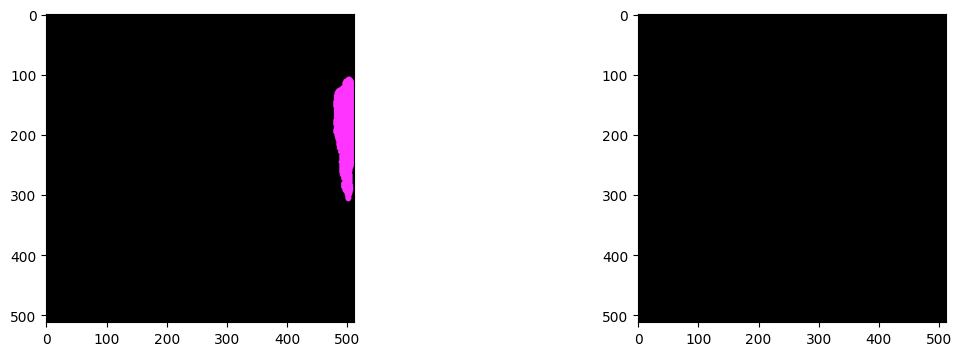

In [114]:
# Get the output from the model and the target from the batch
output = train_batch["annotation_rgb"]
target = model(train_batch["image"].to(device))

# Visualize the output and target images
plt.figure(figsize=(14,4))
ax = plt.subplot(1, 2, 1)
plt.imshow(np.clip(np.transpose(output.numpy()[0], (1, 2, 0)).astype(float), 0, 1))  # Visualize output
ax = plt.subplot(1, 2, 2)
plt.imshow(np.clip(np.transpose(target.detach().cpu().numpy()[0], (1, 2, 0)).astype(float), 0, 1))  # Visualize target

# Calculate and print the loss between the output and target images
loss = criterion(output, target.detach().cpu())
print(loss)


In [115]:
from tqdm import tqdm

# Function to train one epoch of the model
def train_epoch(model, loader, criterion, optimiser):
    model.train()
    losses = []
    first_batch = None
    for i, inputs in enumerate(tqdm(loader)):
        if i == 0:
            first_batch = inputs
        # Forward pass
        out = model(inputs["image"].to(device))
        # Calculate the loss
        loss = criterion(out, inputs["annotation_rgb"].to(device))

        # Backpropagation
        optimiser.zero_grad()
        loss.backward()
        optimiser.step()

        # Store the loss
        losses.append(loss.item())

        # Clear memory
        del inputs, out
        torch.cuda.empty_cache()

    return np.mean(losses), first_batch

# Function to evaluate one epoch of the model
def test_epoch(model, loader, criterion):
    model.eval()
    losses = []
    first_batch = None
    with torch.no_grad():
        for i, inputs in enumerate(tqdm(loader)):
            if i == 0:
                first_batch = inputs
            # Forward pass
            out = model(inputs["image"].to(device))
            # Calculate the loss
            loss = criterion(out, inputs["annotation_rgb"].to(device))
            # Store the loss
            losses.append(loss.item())

            # Clear memory
            del inputs, out

    return np.mean(losses), first_batch

# Function to visualize the model outputs
def visualise_outputs(model, batch):
    plt.figure(figsize=(14,4))
    n = 10
    for i, item in enumerate(batch["image"][:n]):
        with torch.no_grad():
            # Get the reconstructed output from the model
            reconstructed = model(item.unsqueeze(dim=0).to(device))

        ax = plt.subplot(2, n, i+1)
        # Plot the actual annotation
        plt.imshow(np.clip(np.transpose(batch["annotation_rgb"][i].numpy(), (1, 2, 0)).astype(float), 0, 1))
        ax.get_xaxis().set_visible(False)
        ax.get_yaxis().set_visible(False)
        if i == n//2:
          ax.set_title("True Annotation")

        ax = plt.subplot(2, n, i+n+1)
        # Plot the predicted annotation
        plt.imshow(np.clip(np.transpose(reconstructed.cpu().squeeze().numpy(), (1, 2, 0)).astype(float), 0, 1))
        ax.get_xaxis().set_visible(False)
        ax.get_yaxis().set_visible(False)
        if i == n//2:
            ax.set_title("Predicted Annotation")

    plt.show()

# Example usage of visualise_outputs function
# visualise_outputs(model, train_batch)


In [116]:
if to_train:
  for epoch in range(cur_epoch, num_epochs):
    print(f"\nEpoch ({epoch}/{num_epochs-1}):")
    if os.path.exists(f"{root_dir}/model/{model_name}"):
        train_loss_history, val_loss_history = load_history(f"{root_dir}/model/{model_name}")

    # Train the model for one epoch
    train_avg_loss, first_batch = train_epoch(model, train_loader, criterion, optimiser)
    print(f"\tAverage Train Loss: {train_avg_loss:.4f}")
    visualise_outputs(model, batch=first_batch)

    # Save the model checkpoint after training
    torch.save({"epoch": epoch+1,
                "model_state_dict": model.state_dict(),
                "optimiser_state_dict": optimiser.state_dict(),
                "train_loss_history": train_loss_history + [train_avg_loss],
                "val_loss_history": val_loss_history},
                f"{root_dir}/model/{model_name}")

    # Validation
    avg_val_loss, first_batch = test_epoch(model, val_loader, criterion)
    print(f"\tAverage Validation Loss: {avg_val_loss:.4f}")
    visualise_outputs(model, batch=first_batch)

    # Update the validation loss history in the saved model checkpoint
    model_checkpoint = torch.load(f"{root_dir}/model/{model_name}" ,map_location=torch.device('cpu') )
    model_checkpoint["val_loss_history"].append(avg_val_loss)
    torch.save(model_checkpoint, f"{root_dir}/model/{model_name}")


I switched to a simpler architecture from UNet was prompted by the poor performance and excessive computational requirements of UNet, suggesting a need for a more efficient approach. It is a simpler architecture composed of an encoder and a decoder. The encoder utilizes convolutional layers for feature extraction, comprising four sequential convolutional blocks, each followed by batch normalization and ReLU activation. Two max-pooling layers are interspersed to downsample the input image progressively. Conversely, the decoder consists of upsampling layers, batch normalization, and ReLU activation, followed by transposed convolutional layers. These layers aim to restore the spatial dimensions of the encoded representation, ultimately reconstructing the original image. Additionally, a sigmoid activation function is applied to ensure the output pixel values fall within the range [0, 1].

In [117]:
import torch.nn as nn
import torch.nn.functional as F

class Encoder(nn.Module):
    def __init__(self):
        super().__init__()
        # Define convolutional layers for feature extraction
        self.conv1 = nn.Sequential(
            nn.Conv2d(3, 16, kernel_size=3, stride=1),
            nn.BatchNorm2d(16),
            nn.ReLU()
        )
        self.conv2 = nn.Sequential(
            nn.Conv2d(16, 32, kernel_size=3, stride=1),
            nn.BatchNorm2d(32),
            nn.ReLU()
        )
        # Max-pooling layer for downsampling
        self.maxpool1 = nn.MaxPool2d(kernel_size=3)
        self.conv3 = nn.Sequential(
            nn.Conv2d(32, 64, kernel_size=3, stride=1),
            nn.BatchNorm2d(64),
            nn.ReLU()
        )
        self.conv4 = nn.Sequential(
            nn.Conv2d(64, 128, kernel_size=3, stride=1),
            nn.BatchNorm2d(128),
            nn.ReLU()
        )
        # Second max-pooling layer for further downsampling
        self.maxpool2 = nn.MaxPool2d(kernel_size=3)

    def forward(self, x):
        # Forward pass through the encoder
        self.input_size = x.shape[2:]  # Store the input size for later use
        x = self.conv1(x)
        x = self.conv2(x)
        x = self.maxpool2(x)
        x = self.conv3(x)
        x = self.conv4(x)
        x = self.maxpool2(x)
        return x

class Decoder(nn.Module):
    def __init__(self):
        super().__init__()
        # Upsampling layers followed by transposed convolutions for decoding
        self.upsample1 = nn.Sequential(
            nn.BatchNorm2d(128),
            nn.ReLU(),
            nn.Upsample((64, 64))
        )
        self.tconv1 = nn.Sequential(
            nn.BatchNorm2d(128),
            nn.ReLU(),
            nn.ConvTranspose2d(128, 32, kernel_size=2, stride=2)
        )
        self.tconv2 = nn.Sequential(
            nn.BatchNorm2d(32),
            nn.ReLU(),
            nn.ConvTranspose2d(32, 16, kernel_size=2, stride=2)
        )
        # Final transposed convolution for reconstructing the image
        self.tconv3 = nn.Sequential(
            nn.BatchNorm2d(16),
            nn.ReLU(),
            nn.ConvTranspose2d(16, 3, kernel_size=2, stride=2),
        )
        # Sigmoid activation to ensure output pixel values are in the range [0, 1]
        self.sigmoid = nn.Sigmoid()

    def forward(self, x, target_size):
        # Forward pass through the decoder
        x = self.upsample1(x)
        x = self.tconv1(x)
        x = self.tconv2(x)
        x = self.tconv3(x)
        # Apply sigmoid activation and bilinear interpolation to match the target size
        x = self.sigmoid(F.interpolate(x, size=target_size, mode='bilinear', align_corners=True))
        return x

class EncoderDecoder(nn.Module):
    def __init__(self, encoder, decoder):
        super().__init__()
        self.encoder = encoder
        self.decoder = decoder

    def forward(self, x):
        # Forward pass through the encoder and decoder
        return self.decoder(self.encoder(x), x.shape[2:])


# Encoder/ Decoder Evaluation
This model from my implementation could do more iterations of epochs and overall had better results in finding the damages in the pictures.

In [118]:
num_epochs = 10
learning_rate = 0.01
momentum = 0.9

# Initialize the encoder and decoder
encoder = Encoder()
decoder = Decoder()

# Create the Encoder-Decoder model
model = EncoderDecoder(encoder, decoder).to(device)

# Define the loss function and optimizer
criterion = DiceLoss
optimiser = torch.optim.SGD(model.parameters(), lr=learning_rate, weight_decay=0.001, momentum=momentum)

# Define the model name and directory for saving/loading checkpoints
model_name = f"damage_details.pt"
model_dir = f"{root_dir}/model"

# Ensure the model directory exists
os.makedirs(model_dir, exist_ok=True)

# Load model checkpoint if it exists
cur_epoch, train_loss_history, val_loss_history = load_model(f"{model_dir}/{model_name}", model, optimiser)

# Print the last epoch's details if available
if len(train_loss_history) > 0:
    print(f"{model_name}\n\tEpoch: {cur_epoch}\n\tTrain Loss: {train_loss_history[-1]:.4f}\n\tValidation Loss: {val_loss_history[-1] if len(val_loss_history) > 0 else 0:.4f}")


if to_train:
# Training loop
  for epoch in range(cur_epoch, num_epochs):
    print(f"\nEpoch [{epoch}/{num_epochs-1}]:")

    # Load history from checkpoint if available
    if os.path.exists(f"{model_dir}/{model_name}"):
        train_loss_history, val_loss_history = load_history(f"{model_dir}/{model_name}")

    # Train the model for one epoch
    avg_train_loss, first_batch = train_epoch(model, train_loader, criterion, optimiser)
    print(f"\tAverage Train Loss: {avg_train_loss:.4f}")

    # Visualize model outputs
    visualise_outputs(model, batch=first_batch)

    # Save the model checkpoint
    torch.save({
        "epoch": epoch+1,
        "model_state_dict": model.state_dict(),
        "optimiser_state_dict": optimiser.state_dict(),
        "train_loss_history": train_loss_history + [avg_train_loss],
        "val_loss_history": val_loss_history
    }, f"{model_dir}/{model_name}")

    # Validate the model
    avg_val_loss, first_batch = test_epoch(model, val_loader, criterion)
    print(f"\tAverage Validation Loss: {avg_val_loss:.4f}")

    # Visualize validation outputs
    visualise_outputs(model, batch=first_batch)

    # Update model checkpoint with validation loss
    model_checkpoint = torch.load(f"{model_dir}/{model_name}", map_location=torch.device('cpu'))
    model_checkpoint["val_loss_history"].append(avg_val_loss)
    torch.save(model_checkpoint, f"{model_dir}/{model_name}")


damage_details.pt
	Epoch: 10
	Train Loss: 0.9026
	Validation Loss: 0.8846


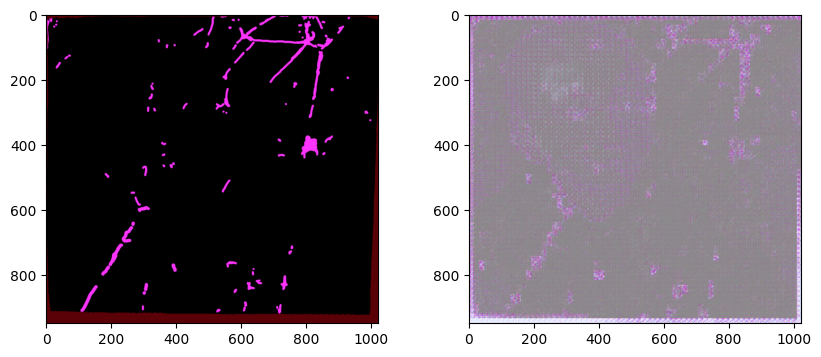

tensor([[1.]])


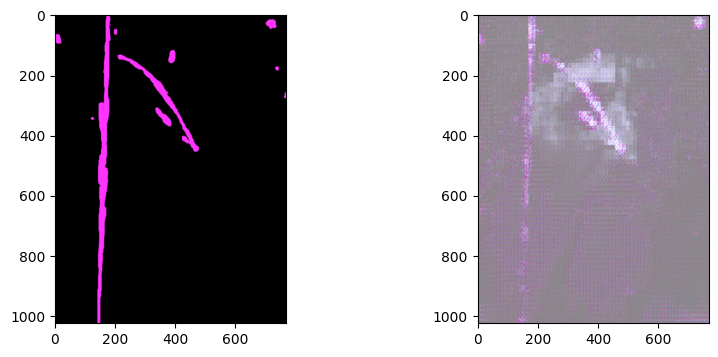

tensor([[1.]])


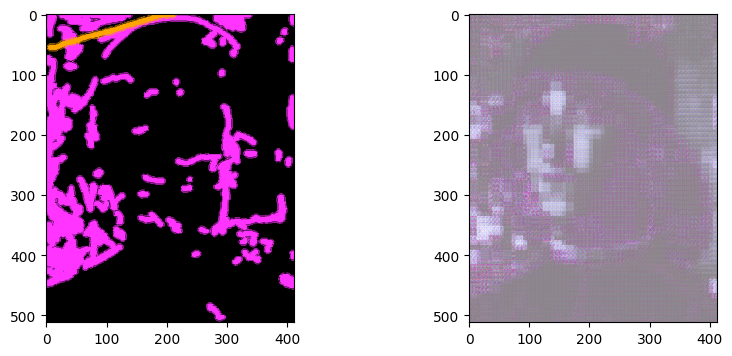

tensor([[1.]])


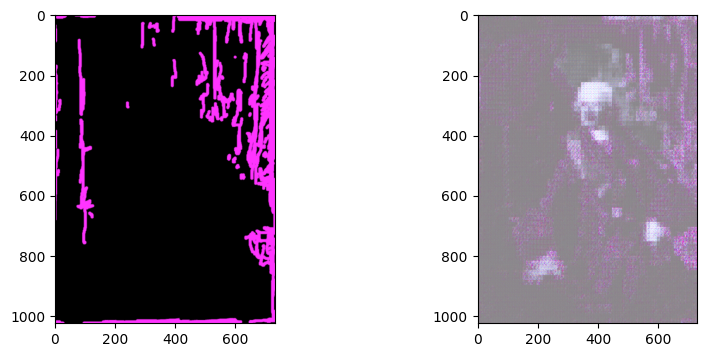

tensor([[1.]])


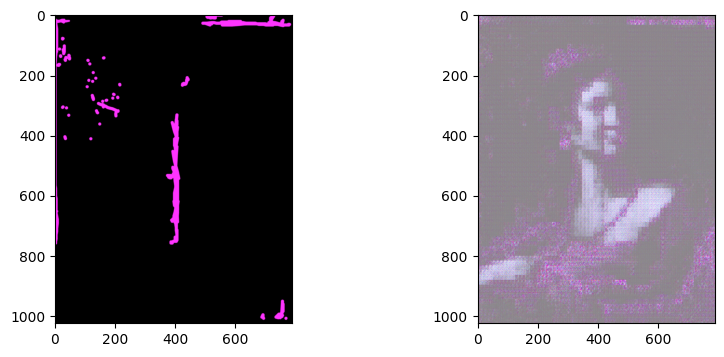

tensor([[1.]])


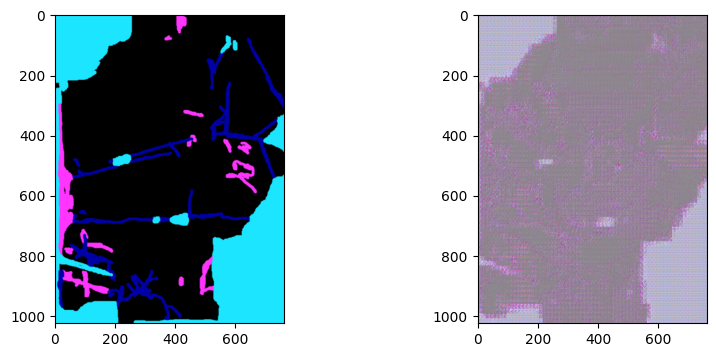

tensor([[1.]])


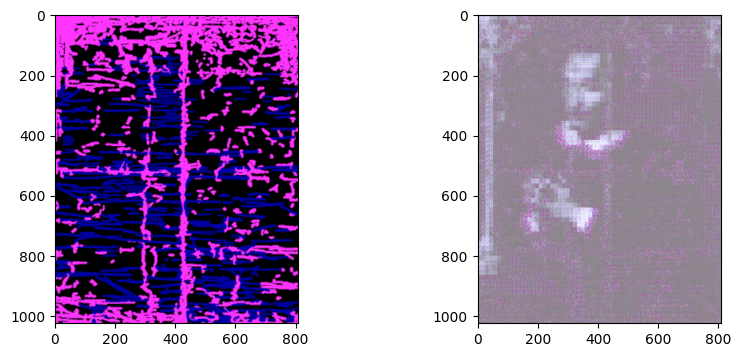

tensor([[1.]])


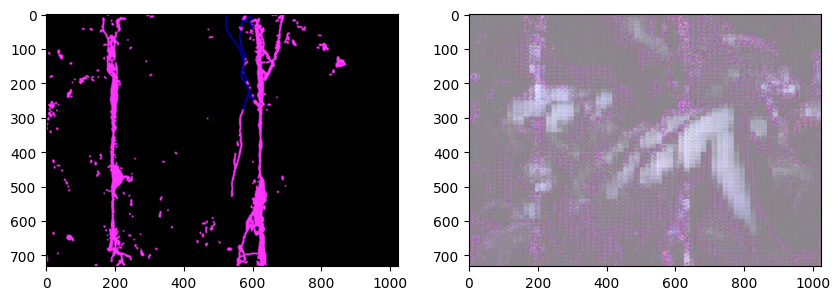

tensor([[1.]])


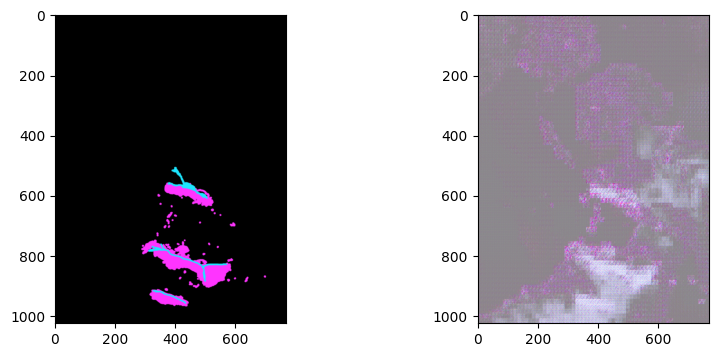

tensor([[1.]])


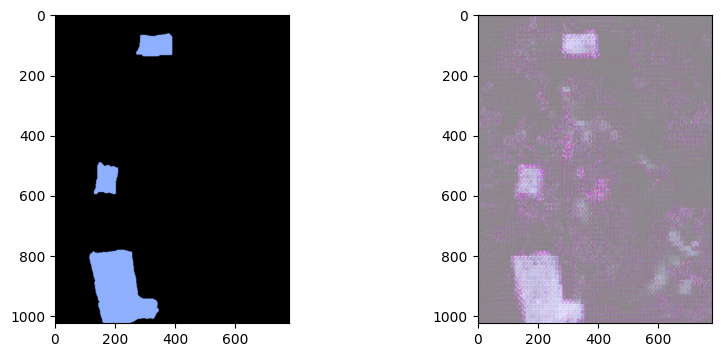

tensor([[1.]])


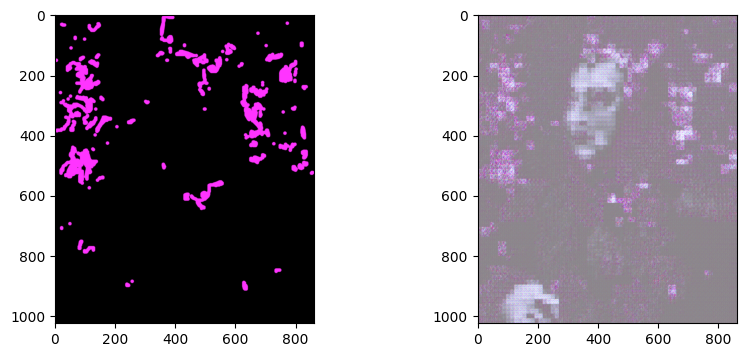

tensor([[1.]])


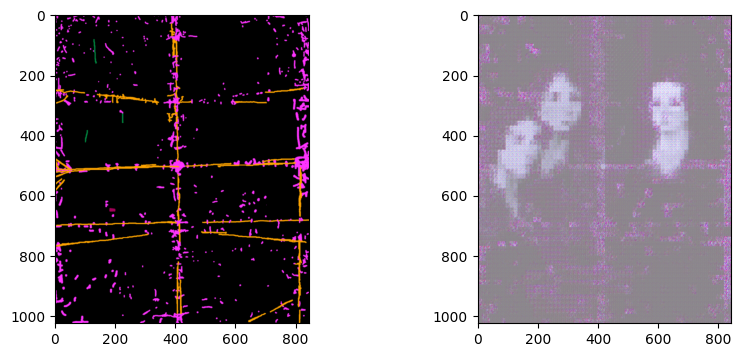

tensor([[1.]])


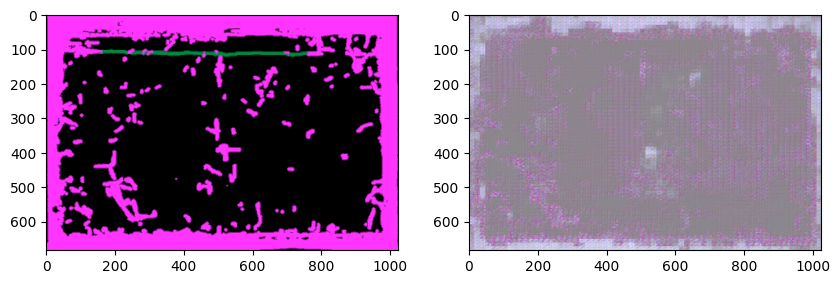

tensor([[1.]])


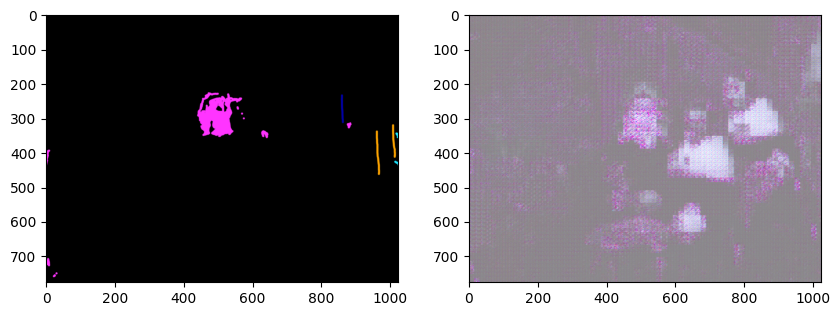

tensor([[1.]])


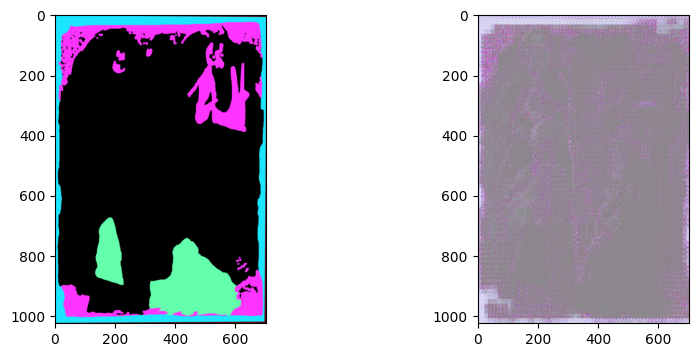

tensor([[1.]])


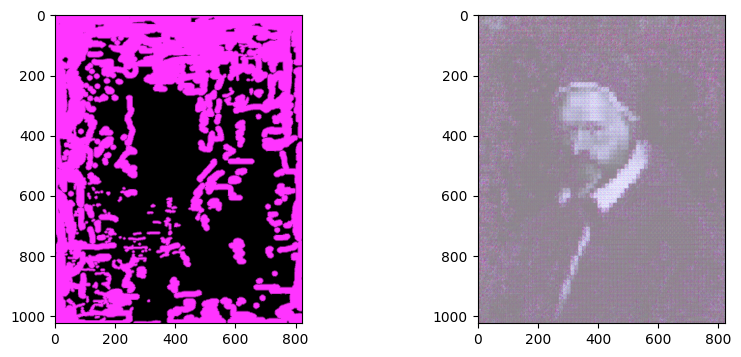

tensor([[1.]])


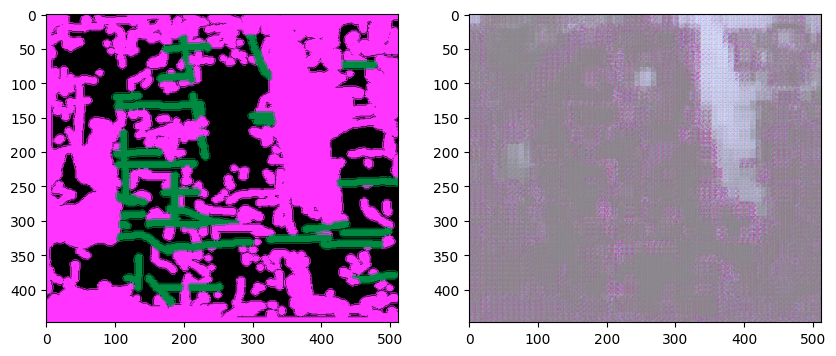

tensor([[1.]])


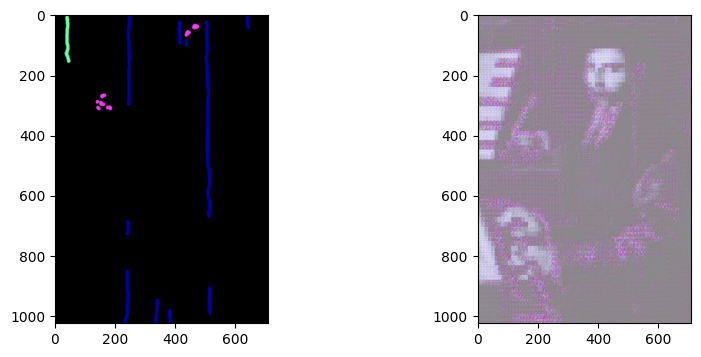

tensor([[1.]])


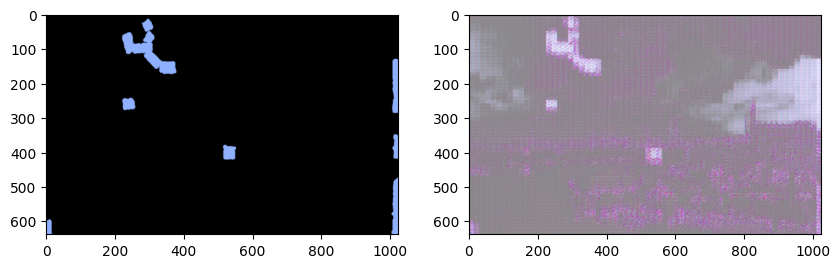

tensor([[1.]])


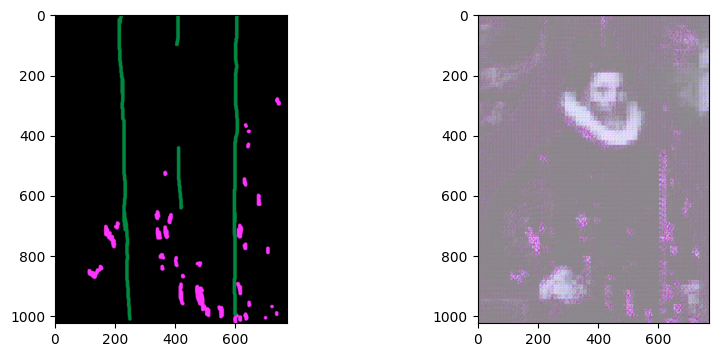

tensor([[1.]])


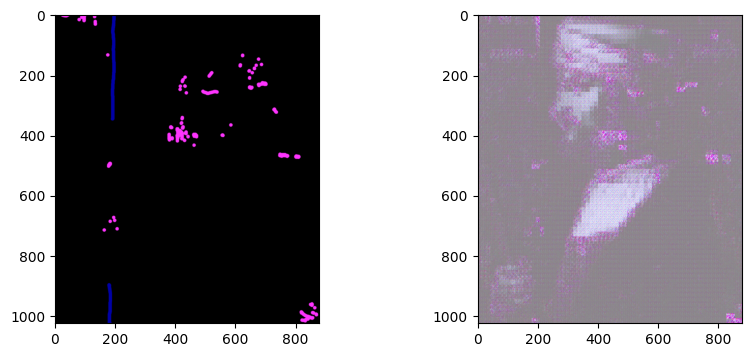

tensor([[1.]])


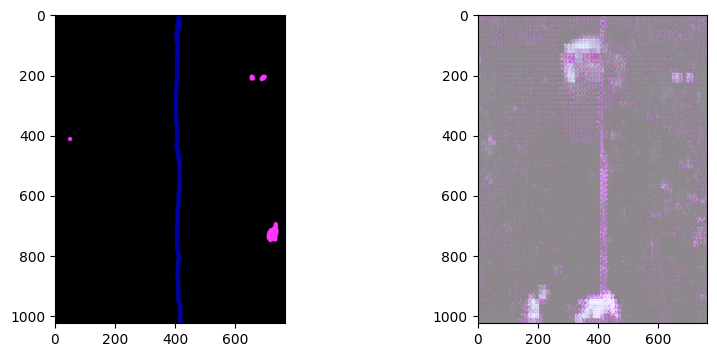

tensor([[1.]])


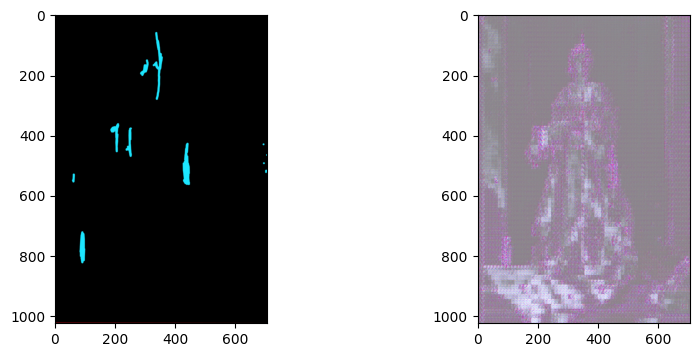

tensor([[1.]])
torch.Size([23])


In [119]:
from transformers import CLIPProcessor, CLIPModel

def visualize_comparison(output, target):
    plt.figure(figsize=(10,4))
    ax = plt.subplot(1, 2, 1)
    plt.imshow(np.clip(np.transpose(output.numpy()[0], (1, 2, 0)).astype(float), 0, 1))
    ax = plt.subplot(1, 2, 2)
    plt.imshow(np.clip(np.transpose(target.cpu().numpy()[0], (1, 2, 0)).astype(float), 0, 1))
    plt.show()

def calculate_similarity(processor, clip, outputs, targets):
    processed_outputs = processor(text=None, images=outputs.squeeze(), return_tensors="pt", padding=True)["pixel_values"].to(device)
    processed_targets = processor(text=None, images=targets.squeeze(), return_tensors="pt", padding=True)["pixel_values"].to(device)

    output_embs = clip.get_image_features(pixel_values=processed_outputs)
    target_embs = clip.get_image_features(pixel_values=processed_targets)

    scores = torch.softmax(torch.bmm(output_embs.unsqueeze(1), target_embs[..., None]).squeeze(1), dim=-1)
    return scores

processor = CLIPProcessor.from_pretrained("openai/clip-vit-base-patch32")
clip = CLIPModel.from_pretrained("openai/clip-vit-base-patch32").to(device)

similarities = []
with torch.no_grad():
    for inputs in test_loader:
        outputs = inputs["annotation_rgb"]
        targets = model(inputs["image"].to(device)).detach().cpu()

        visualize_comparison(outputs, targets)

        scores = calculate_similarity(processor, clip, outputs, targets)
        print(scores)
        similarities.append(scores.squeeze())

similarities = torch.stack(similarities)
print(similarities.shape)


# UNet Evaluation

Because of time constraints I could only do two epochs of training which overall made this less accurate to ditect problems in the pictures. If I had more time to do more epochs (without collab crashing on me) then I speculate this would have done much better

In [120]:
num_epochs = 4
learning_rate = 0.01
momentum = 0.9

# Initialize the encoder and decoder
encoder = Encoder()
decoder = Decoder()

# Create the Encoder-Decoder model
model = EncoderDecoder(encoder, decoder).to(device)

# Define the loss function and optimizer
criterion = DiceLoss
optimiser = torch.optim.SGD(model.parameters(), lr=learning_rate, weight_decay=0.001, momentum=momentum)

# Define the model name and directory for saving/loading checkpoints
model_name = f"unet_damage_details.pt"
model_dir = f"{root_dir}/model"

# Ensure the model directory exists
os.makedirs(model_dir, exist_ok=True)

# Load model checkpoint if it exists
cur_epoch, train_loss_history, val_loss_history = load_model(f"{model_dir}/{model_name}", model, optimiser)

# Print the last epoch's details if available
if len(train_loss_history) > 0:
    print(f"{model_name}\n\tEpoch: {cur_epoch}\n\tTrain Loss: {train_loss_history[-1]:.4f}\n\tValidation Loss: {val_loss_history[-1] if len(val_loss_history) > 0 else 0:.4f}")



unet_damage_details.pt
	Epoch: 2
	Train Loss: 0.9110
	Validation Loss: 0.8897


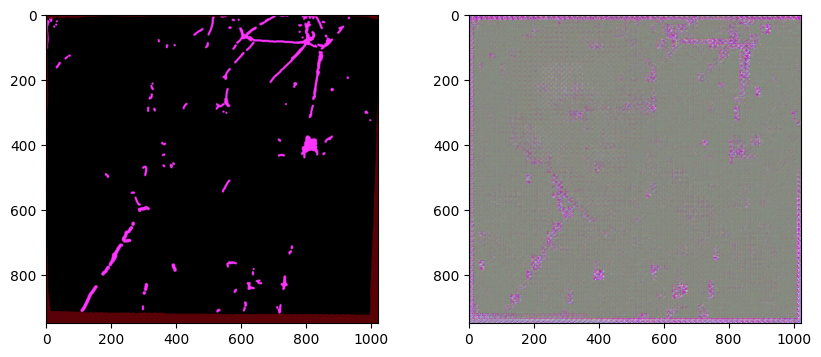

tensor([[1.]])


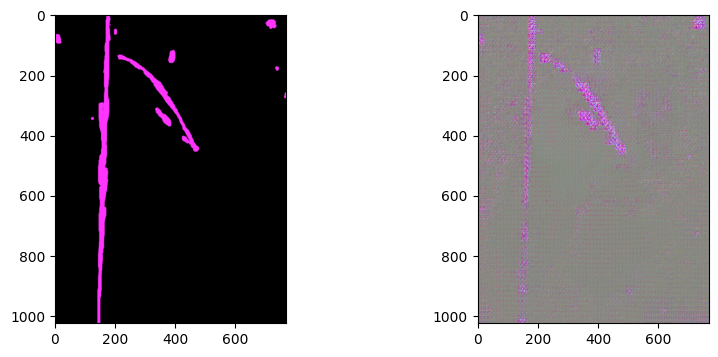

tensor([[1.]])


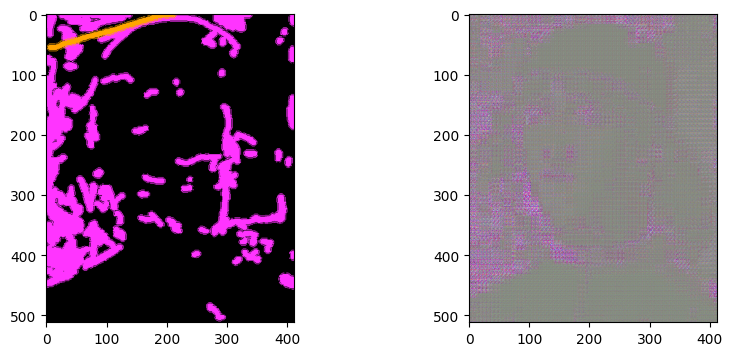

tensor([[1.]])


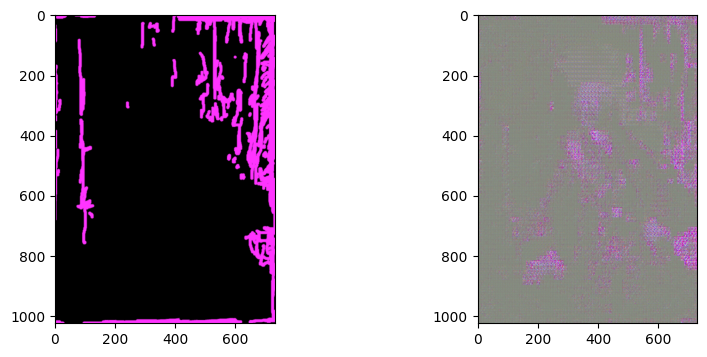

tensor([[1.]])


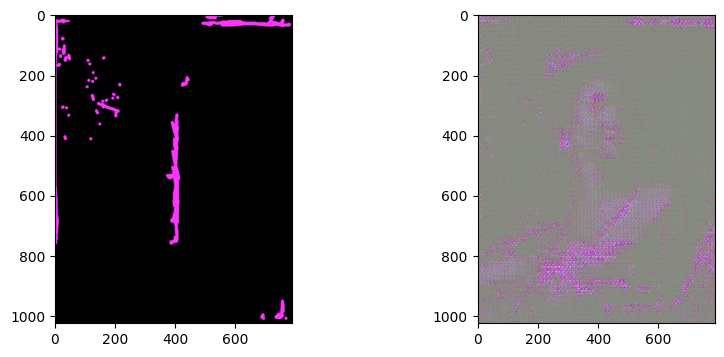

tensor([[1.]])


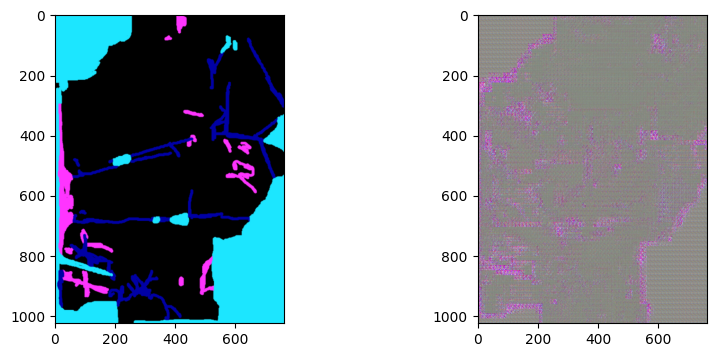

tensor([[1.]])


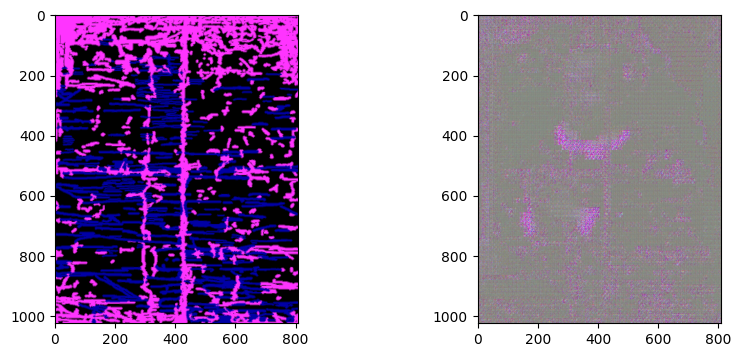

tensor([[1.]])


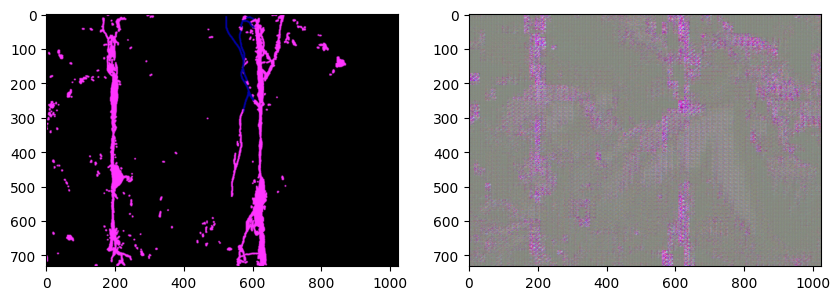

tensor([[1.]])


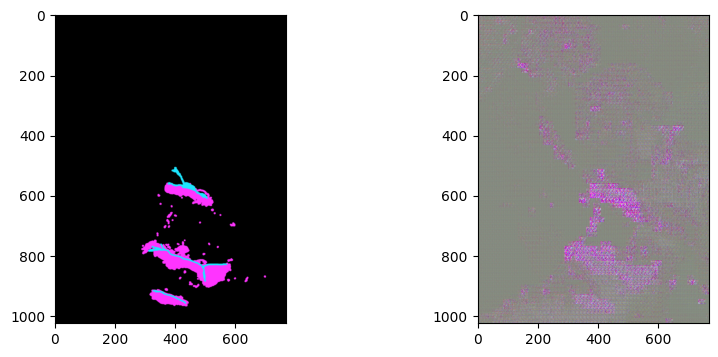

tensor([[1.]])


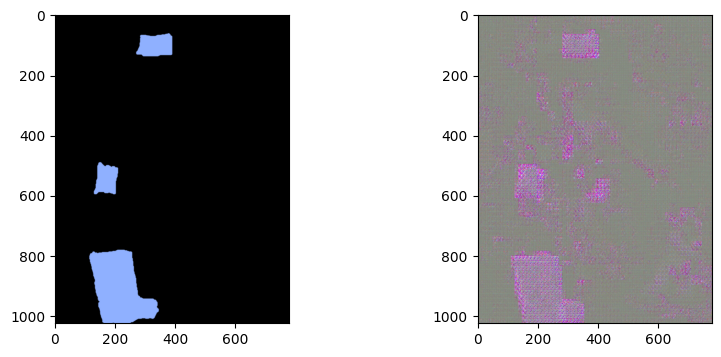

tensor([[1.]])


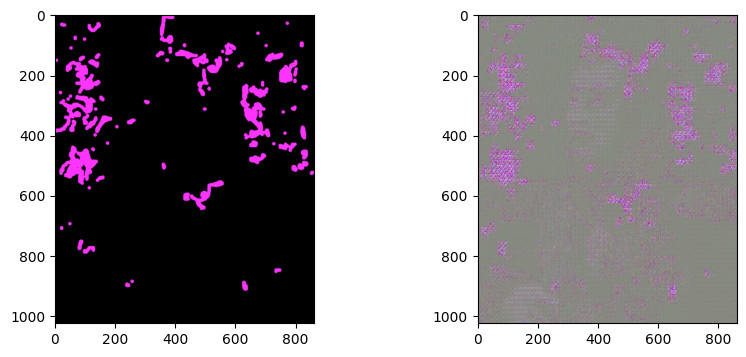

tensor([[1.]])


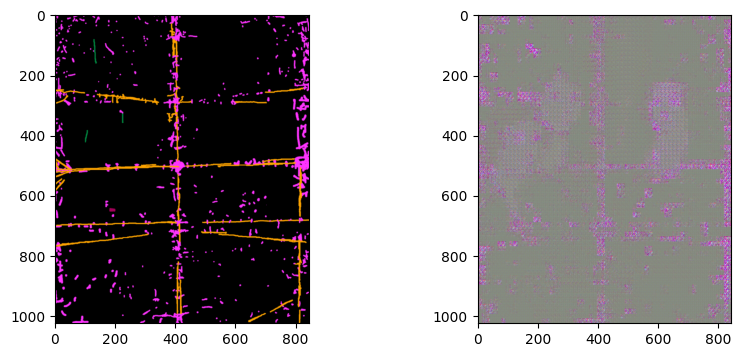

tensor([[1.]])


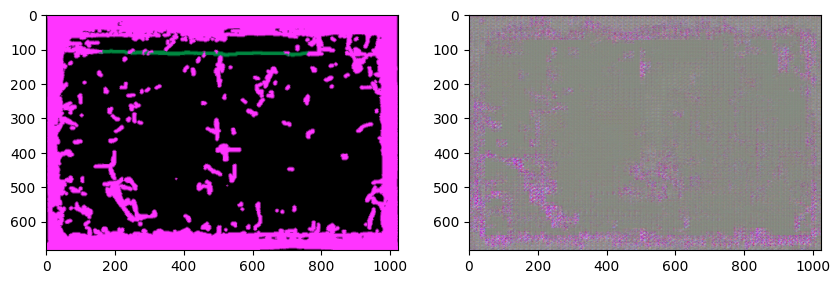

tensor([[1.]])


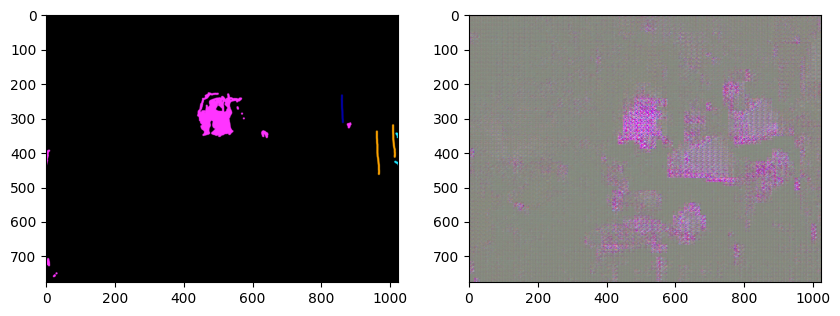

tensor([[1.]])


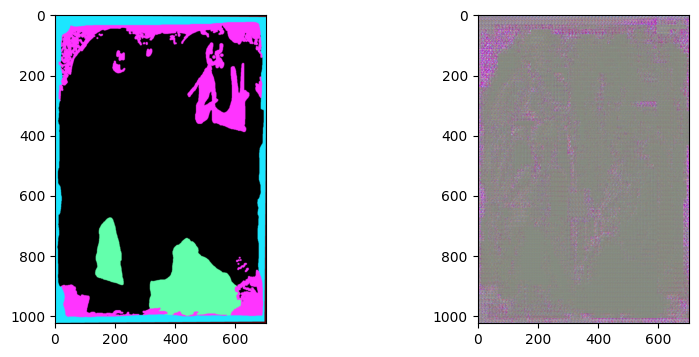

tensor([[1.]])


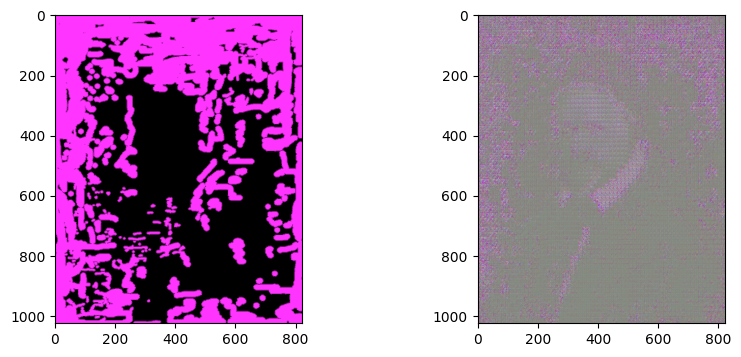

tensor([[1.]])


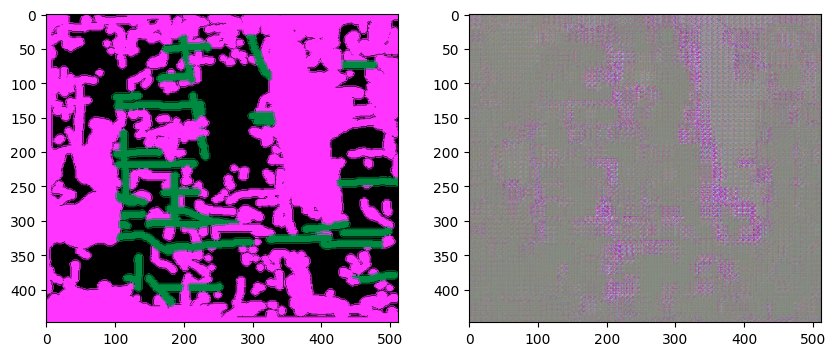

tensor([[1.]])


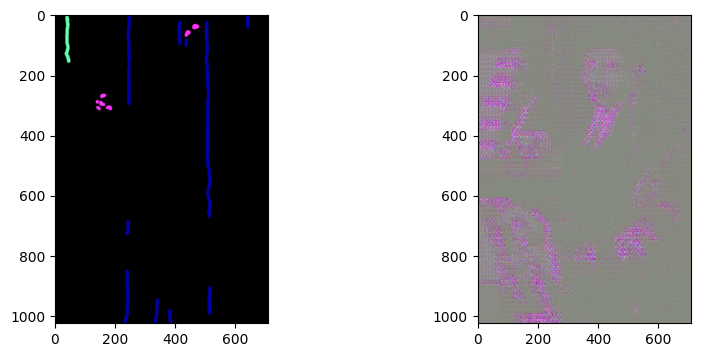

tensor([[1.]])


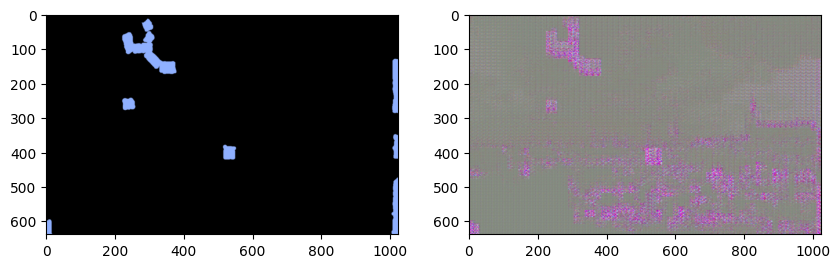

tensor([[1.]])


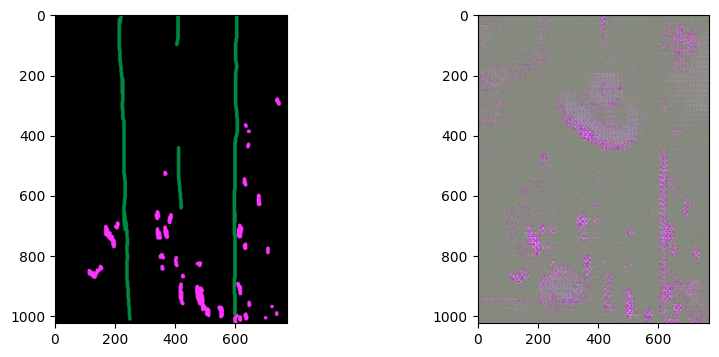

tensor([[1.]])


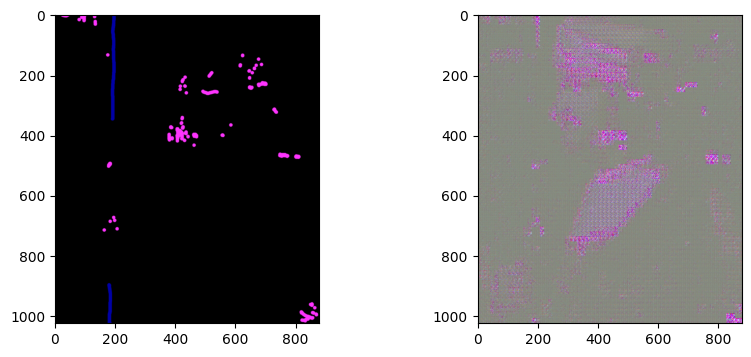

tensor([[1.]])


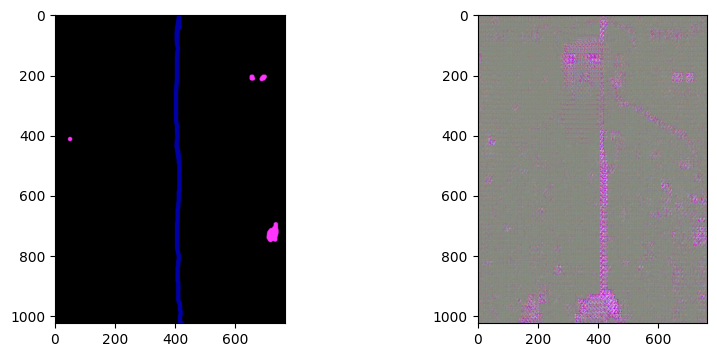

tensor([[1.]])


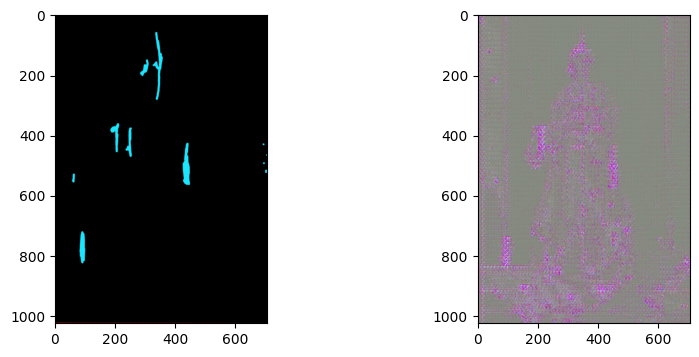

tensor([[1.]])
torch.Size([23])


In [121]:
processor = CLIPProcessor.from_pretrained("openai/clip-vit-base-patch32")
clip = CLIPModel.from_pretrained("openai/clip-vit-base-patch32").to(device)

similarities = []
with torch.no_grad():
    for inputs in test_loader:
        outputs = inputs["annotation_rgb"]
        targets = model(inputs["image"].to(device)).detach().cpu()

        visualize_comparison(outputs, targets)

        scores = calculate_similarity(processor, clip, outputs, targets)
        print(scores)
        similarities.append(scores.squeeze())

similarities = torch.stack(similarities)
print(similarities.shape)